In [1]:
import glob
for path in glob.glob("**/data.mat", recursive=True):
    print(path)


exp/datasets/anes_data/simu/1/data.mat
exp/datasets/anes_data/simu/2/data.mat
exp/datasets/anes_data/simu/3/data.mat
exp/datasets/anes_data/simu/4/data.mat
exp/datasets/anes_data/vivo/data.mat


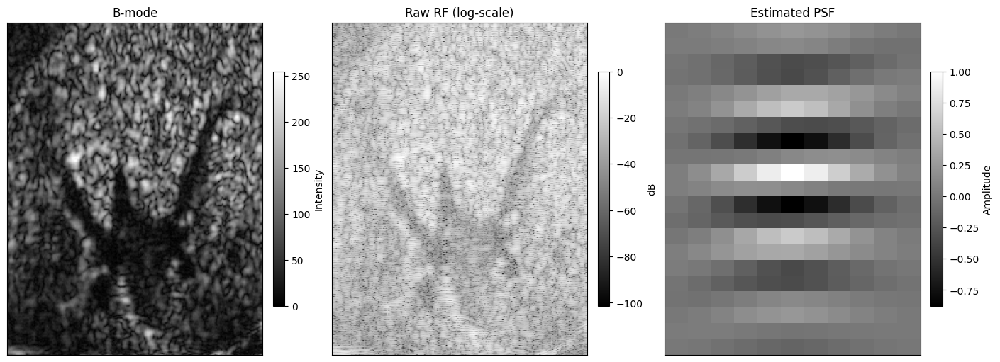

In [2]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 1) Load the .mat file
# ---------------------------------------------------------------------
mat_path = "exp/datasets/anes_data/vivo/data.mat"     # <-- adjust path
mat       = sio.loadmat(mat_path)

rf    = mat["rf"]                # raw RF lines  (401×200)
bmode = mat["bmode"]             # envelope image
psf   = mat["PSF_estim"]         # estimated PSF (21×11)

# Log-compress the RF for visualisation (dB scale)
rf_log = 20 * np.log10(np.abs(rf) / np.max(np.abs(rf)) + 1e-6)

# ---------------------------------------------------------------------
# 2) Prepare the side-by-side figure
# ---------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(14, 5), constrained_layout=True)

# ---- B-mode ----
im0 = axes[0].imshow(bmode, cmap="gray", aspect="auto")
axes[0].set_title("B-mode")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label="Intensity")

# ---- RF (log) ----
im1 = axes[1].imshow(rf_log, cmap="gray", aspect="auto")
axes[1].set_title("Raw RF (log-scale)")
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label="dB")

# ---- PSF ----
im2 = axes[2].imshow(psf, cmap="gray", aspect="auto")
axes[2].set_title("Estimated PSF")
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label="Amplitude")

# A little clean-up
for ax in axes:
    ax.set_xticks([])     # hide tick marks (optional)
    ax.set_yticks([])

plt.show()


In [3]:
print(rf.shape)
print(psf.shape)

(401, 200)
(21, 11)


----- BEFORE NORMALISATION -----
RF   shape: (401, 200),   range: [-119.1064, 130.8936]
PSF  shape: (21, 11), range: [-0.8789, 1.0000]

----- AFTER NORMALISATION -----
RF_norm shape: (401, 200), range: [-1.0000, 1.0000]


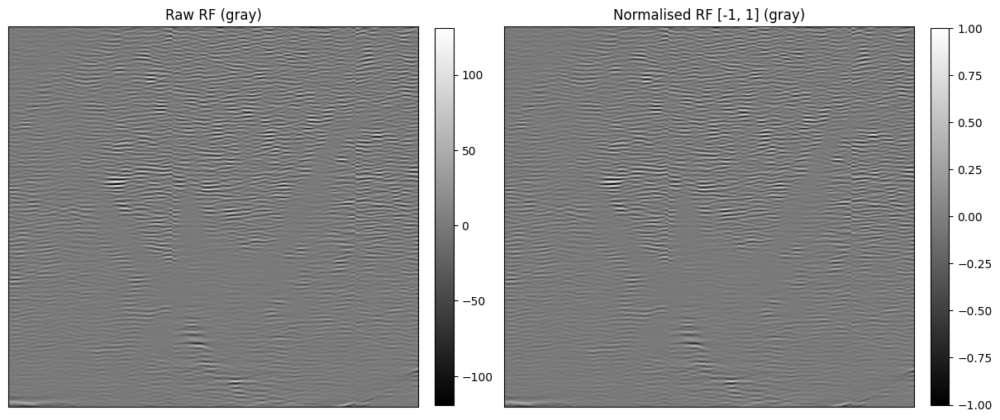

In [4]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load the .mat file
# --------------------------------------------------------------
vivo_mat_path = "exp/datasets/anes_data/vivo/data.mat"
mat = sio.loadmat(vivo_mat_path)

rf        = mat["rf"]          # raw RF (401×200)
psf       = mat["PSF_estim"]   # estimated PSF (21×11)
bmode     = mat.get("bmode")   # may be None for some vivo datasets

# --------------------------------------------------------------
# 2) Report shapes and raw ranges
# --------------------------------------------------------------
print("----- BEFORE NORMALISATION -----")
print(f"RF   shape: {rf.shape},   range: [{rf.min():.4f}, {rf.max():.4f}]")
print(f"PSF  shape: {psf.shape}, range: [{psf.min():.4f}, {psf.max():.4f}]")

# --------------------------------------------------------------
# 3) Normalise RF to [-1, 1]
# --------------------------------------------------------------
rf_min, rf_max = rf.min(), rf.max()
rf_norm = 2.0 * (rf - rf_min) / (rf_max - rf_min) - 1.0

# --------------------------------------------------------------
# 4) Report ranges after normalisation
# --------------------------------------------------------------
print("\n----- AFTER NORMALISATION -----")
print(f"RF_norm shape: {rf_norm.shape}, range: [{rf_norm.min():.4f}, {rf_norm.max():.4f}]")
# PSF is *not* normalised here, but you could apply your own scheme if needed.

# --------------------------------------------------------------
# 5) Side-by-side grayscale visualisation
# --------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# Raw RF
im0 = axes[0].imshow(rf, cmap="gray", aspect="auto",
                     vmin=rf_min, vmax=rf_max)
axes[0].set_title("Raw RF (gray)")
axes[0].set_xticks([]); axes[0].set_yticks([])
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Normalised RF
im1 = axes[1].imshow(rf_norm, cmap="gray", aspect="auto",
                     vmin=-1, vmax=1)
axes[1].set_title("Normalised RF [-1, 1] (gray)")
axes[1].set_xticks([]); axes[1].set_yticks([])
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

plt.show()


----- PSF SUMMARY -----
Shape       : (21, 11)
Value range : [-0.88, 1.00]


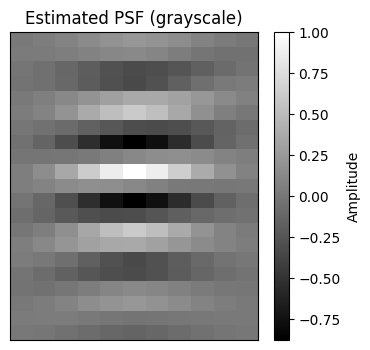

In [5]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load the .mat file
# --------------------------------------------------------------
vivo_mat_path = "exp/datasets/anes_data/vivo/data.mat"  # adjust if needed
mat = sio.loadmat(vivo_mat_path)

rf  = mat["rf"]           # raw RF (401 × 200)
psf = mat["PSF_estim"]    # estimated PSF (21 × 11)

# --------------------------------------------------------------
# 2) Report PSF statistics
# --------------------------------------------------------------
print("----- PSF SUMMARY -----")
print(f"Shape       : {psf.shape}")                            # --> (21, 11)
print(f"Value range : [{psf.min():.2f}, {psf.max():.2f}]")     # --> ≈ [-0.88, 1.00]

# --------------------------------------------------------------
# 3) Visualise the PSF
# --------------------------------------------------------------
plt.figure(figsize=(4, 4))
plt.imshow(psf, cmap="gray", aspect="auto")
plt.title("Estimated PSF (grayscale)")
plt.colorbar(label="Amplitude")
plt.xticks([]); plt.yticks([])
plt.show()


----- NORMALISED PSF -----
Shape          : (21, 11)
Original range : [-0.88, 1.00]
Scaled range   : [-0.88, 1.00]
max(|psf_norm|): 1.00


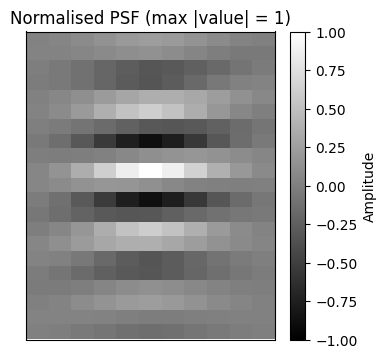

In [6]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load data
# --------------------------------------------------------------
vivo_mat_path = "exp/datasets/anes_data/vivo/data.mat"   # adjust path if needed
mat  = sio.loadmat(vivo_mat_path)
psf  = mat["PSF_estim"].astype(np.float32)               # (21 × 11)

# --------------------------------------------------------------
# 2) Normalise: max(|psf|) = 1
# --------------------------------------------------------------
scale = np.max(np.abs(psf))
psf_norm = psf / scale

# --------------------------------------------------------------
# 3) Report statistics
# --------------------------------------------------------------
print("----- NORMALISED PSF -----")
print(f"Shape          : {psf_norm.shape}")                        # (21, 11)
print(f"Original range : [{psf.min():.2f}, {psf.max():.2f}]")
print(f"Scaled range   : [{psf_norm.min():.2f}, {psf_norm.max():.2f}]")
print(f"max(|psf_norm|): {np.max(np.abs(psf_norm)):.2f}")

# --------------------------------------------------------------
# 4) Visualise (optional)
# --------------------------------------------------------------
plt.figure(figsize=(4, 4))
plt.imshow(psf_norm, cmap="gray", aspect="auto", vmin=-1, vmax=1)
plt.title("Normalised PSF (max |value| = 1)")
plt.colorbar(label="Amplitude")
plt.xticks([]); plt.yticks([])
plt.show()


In [12]:
import os
# Define the new target directory
target_dir = "vivo"
os.makedirs(target_dir, exist_ok=True)

# Define target paths
rf_norm_target = os.path.join(target_dir, "rf_norm.mat")
psf_norm_target = os.path.join(target_dir, "psf_norm.mat")

# Save the normalized RF and PSF
sio.savemat(rf_norm_target, {"rf_norm": rf_norm})
sio.savemat(psf_norm_target, {"psf_norm": psf_norm})

# Confirm paths
rf_norm_target, psf_norm_target


('vivo/rf_norm.mat', 'vivo/psf_norm.mat')

----- LOADED NORMALIZED RF -----
Shape       : (401, 200)
Value range : [-1.00, 1.00]

----- LOADED NORMALIZED PSF -----
Shape       : (21, 11)
Value range : [-0.88, 1.00]


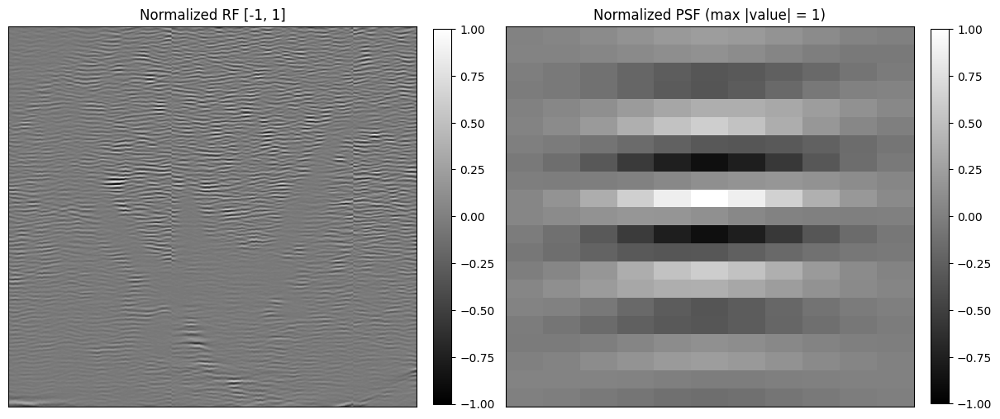

In [13]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load normalized RF and PSF from saved .mat files
# --------------------------------------------------------------
rf_data  = sio.loadmat("vivo/rf_norm.mat")["rf_norm"]
psf_data = sio.loadmat("vivo/psf_norm.mat")["psf_norm"]

# --------------------------------------------------------------
# 2) Report stats
# --------------------------------------------------------------
print("----- LOADED NORMALIZED RF -----")
print(f"Shape       : {rf_data.shape}")
print(f"Value range : [{rf_data.min():.2f}, {rf_data.max():.2f}]")

print("\n----- LOADED NORMALIZED PSF -----")
print(f"Shape       : {psf_data.shape}")
print(f"Value range : [{psf_data.min():.2f}, {psf_data.max():.2f}]")

# --------------------------------------------------------------
# 3) Visualise both using grayscale
# --------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# RF image
im0 = axes[0].imshow(rf_data, cmap="gray", aspect="auto", vmin=-1, vmax=1)
axes[0].set_title("Normalized RF [-1, 1]")
axes[0].set_xticks([]); axes[0].set_yticks([])
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# PSF image
im1 = axes[1].imshow(psf_data, cmap="gray", aspect="auto", vmin=-1, vmax=1)
axes[1].set_title("Normalized PSF (max |value| = 1)")
axes[1].set_xticks([]); axes[1].set_yticks([])
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

plt.show()


After cropping, shape: (256, 200)
After resizing, shape: (256, 256)


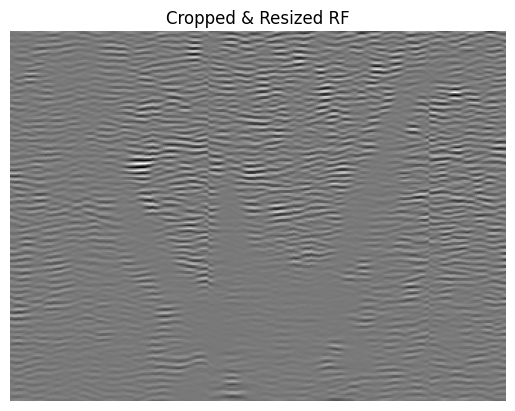

In [2]:
import numpy as np
import scipy.io as sio
import torch
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load normalized RF
# --------------------------------------------------------------
data = sio.loadmat('vivo/rf_norm.mat')
rf_norm = data['rf_norm']  # shape (401, 200)

# --------------------------------------------------------------
# 2) Center-crop to at most 256×256 (no padding)
# --------------------------------------------------------------
h, w = rf_norm.shape
if h > 256:
    start = (h - 256) // 2
    rf_norm = rf_norm[start:start + 256, :]
if w > 256:
    start = (w - 256) // 2
    rf_norm = rf_norm[:, start:start + 256]

print(f"After cropping, shape: {rf_norm.shape}")

# --------------------------------------------------------------
# 3) Resize to 256×256 via bilinear interpolation
# --------------------------------------------------------------
rf_t = torch.tensor(rf_norm, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
rf_t = torch.nn.functional.interpolate(
    rf_t, size=(256, 256), mode="bilinear", align_corners=False
)
rf_resized = rf_t[0, 0].numpy()
print(f"After resizing, shape: {rf_resized.shape}")

# --------------------------------------------------------------
# 4) Visualize the result
# --------------------------------------------------------------
plt.figure()
plt.imshow(rf_resized, aspect="auto",cmap="gray")
plt.title("Cropped & Resized RF")
plt.axis("off")
plt.show()


After cropping rows, shape: (256, 200)
After extending width by flipping, shape: (256, 256)


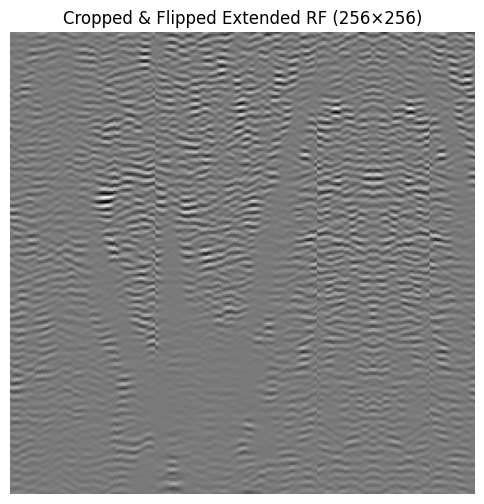

In [6]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# 1) Load normalized RF
# --------------------------------------------------------------
data = sio.loadmat('vivo/rf_norm.mat')
rf_norm = data['rf_norm']  # shape (401, 200)

# --------------------------------------------------------------
# 2) Center-crop rows to 256 (no padding)
# --------------------------------------------------------------
h, w = rf_norm.shape
if h > 256:
    start = (h - 256) // 2
    rf_crop = rf_norm[start:start + 256, :]
else:
    rf_crop = rf_norm.copy()

print(f"After cropping rows, shape: {rf_crop.shape}")

# --------------------------------------------------------------
# 3) Extend width to 256 by horizontal flipping
# --------------------------------------------------------------
w0 = rf_crop.shape[1]
pad_w = 256 - w0
# Use flipped columns from the right side
rf_flip = np.fliplr(rf_crop)
rf_fill = rf_flip[:, :pad_w]  # take first pad_w columns of flipped
rf_extended = np.concatenate([rf_crop, rf_fill], axis=1)

print(f"After extending width by flipping, shape: {rf_extended.shape}")

# --------------------------------------------------------------
# 4) Visualize the result in grayscale
# --------------------------------------------------------------
plt.figure(figsize=(6, 6))
plt.imshow(rf_extended, cmap="gray", aspect="auto")
plt.title("Cropped & Flipped Extended RF (256×256)")
plt.axis("off")
plt.show()


In [7]:
import os
import scipy.io as sio

# Assume rf_extended is already computed in your notebook
# rf_extended.shape == (256, 256)

# --------------------------------------------------------------
# Save rf_extended to MAT-file inside 'vivo' folder
# --------------------------------------------------------------
vivo_dir = "vivo"
os.makedirs(vivo_dir, exist_ok=True)

out_path = os.path.join(vivo_dir, "rf_extended.mat")
sio.savemat(out_path, {"rf_extended": rf_extended})

print(f"Saved cropped & flipped RF to: {out_path}")


Saved cropped & flipped RF to: vivo/rf_extended.mat


rf_norm      shape: (401, 200), range: [-1.00, 1.00]
rf_extended  shape: (256, 256), range: [-1.00, 1.00]
psf_norm     shape: (21, 11), range: [-0.88, 1.00]


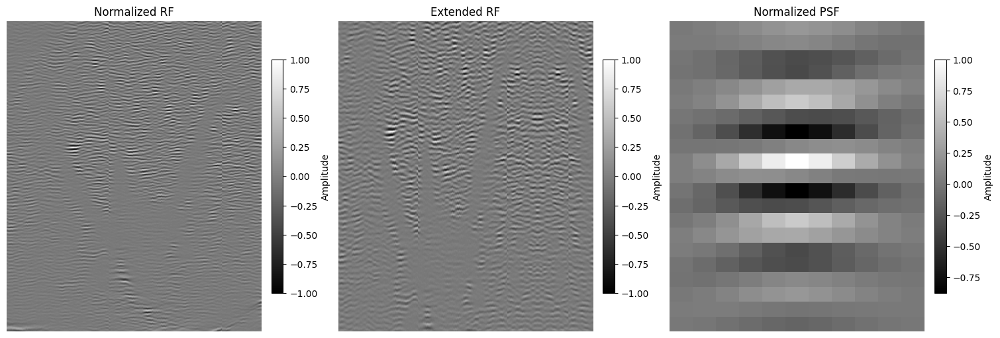

In [8]:
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# Load data from .mat files
# --------------------------------------------------------------
rf_norm      = sio.loadmat('vivo/rf_norm.mat')['rf_norm']
rf_extended  = sio.loadmat('vivo/rf_extended.mat')['rf_extended']
psf_norm     = sio.loadmat('vivo/psf_norm.mat')['psf_norm']

# --------------------------------------------------------------
# Print shapes and value ranges
# --------------------------------------------------------------
for name, arr in [('rf_norm', rf_norm), 
                  ('rf_extended', rf_extended), 
                  ('psf_norm', psf_norm)]:
    print(f"{name:12s} shape: {arr.shape}, range: [{arr.min():.2f}, {arr.max():.2f}]")

# --------------------------------------------------------------
# Visualize side-by-side in grayscale
# --------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
data_list = [rf_norm, rf_extended, psf_norm]
titles    = ['Normalized RF', 'Extended RF', 'Normalized PSF']

for ax, img, title in zip(axes, data_list, titles):
    vmin, vmax = img.min(), img.max()
    im = ax.imshow(img, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Amplitude')

plt.show()


In [9]:
import numpy as np

def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF to the image size
    padded = np.zeros_like(y)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # Fourier transforms
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filtering in frequency domain
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft)**2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT to return to spatial domain
    x_restored = np.fft.ifft2(X_hat).real
    return x_restored


In [10]:
# Apply Wiener deconvolution
restored_rf_norm     = wiener_deconvolution(rf_norm, psf_norm, K=0.05)
restored_rf_extended = wiener_deconvolution(rf_extended, psf_norm, K=0.05)


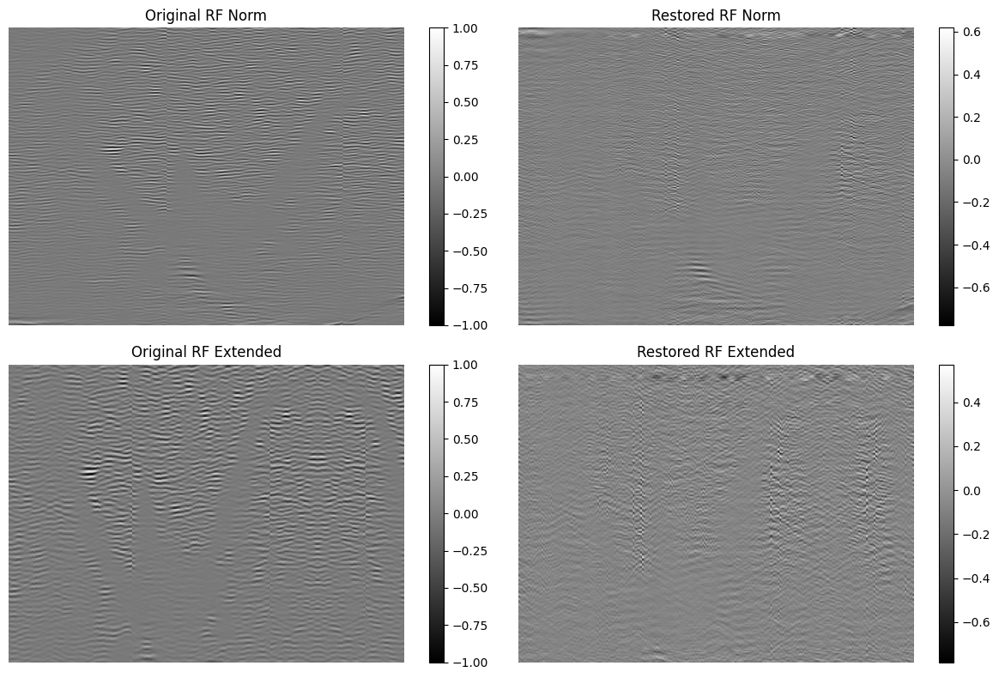

In [11]:
import matplotlib.pyplot as plt

titles = ['Original RF Norm', 'Restored RF Norm', 'Original RF Extended', 'Restored RF Extended']
images = [rf_norm, restored_rf_norm, rf_extended, restored_rf_extended]

plt.figure(figsize=(12, 8))
for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(2, 2, i)
    plt.imshow(img, cmap='gray', aspect='auto')
    plt.title(title)
    plt.colorbar()
    plt.axis('off')
plt.tight_layout()
plt.show()


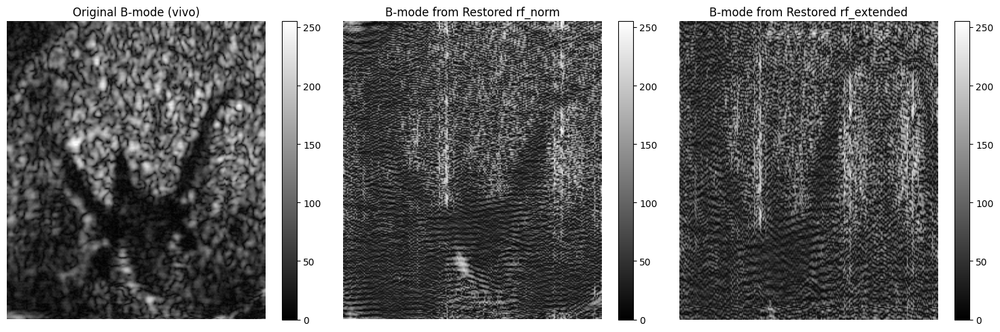

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

import scipy.io as sio

# Load the original B-mode image from vivo dataset
mat_path = 'exp/datasets/anes_data/vivo/data.mat'
mat_data = sio.loadmat(mat_path)

# Extract B-mode image
bmode_vivo = mat_data['bmode']  # This is the reference B-mode for histogram matching


# --- Function to convert RF to B-mode with histogram matching ---
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

from scipy.signal import hilbert
from skimage.exposure import match_histograms

bmode_restored_rf_norm     = rf_to_matched_bmode(restored_rf_norm, bmode_vivo)
bmode_restored_rf_extended = rf_to_matched_bmode(restored_rf_extended, bmode_vivo)

import matplotlib.pyplot as plt

titles = ['Original B-mode (vivo)', 'B-mode from Restored rf_norm', 'B-mode from Restored rf_extended']
images = [bmode_vivo, bmode_restored_rf_norm, bmode_restored_rf_extended]

plt.figure(figsize=(15, 5))
for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(1, 3, i)
    plt.imshow(img, cmap='gray', aspect='auto')
    plt.title(title)
    plt.colorbar()
    plt.axis('off')
plt.tight_layout()
plt.show()


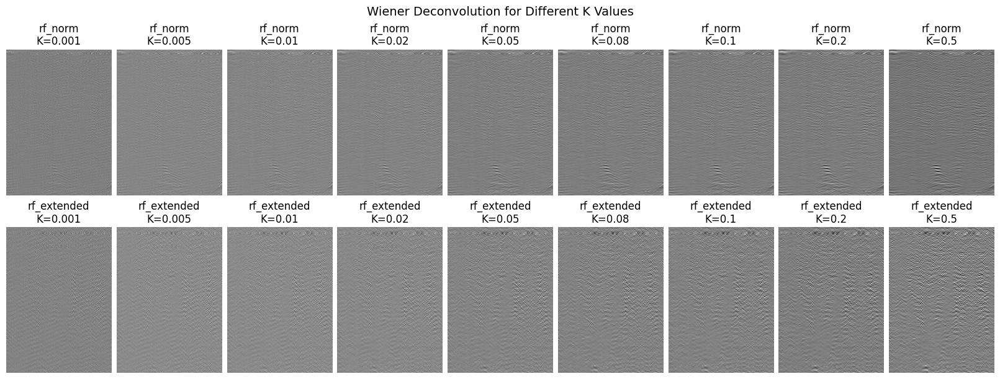

In [21]:
K_values = [0.001, 0.005, 0.01, 0.02, 0.05,0.08,0.1,0.2,0.5]
fig, axes = plt.subplots(2, len(K_values), figsize=(16, 6), constrained_layout=True)

for i, K in enumerate(K_values):
    # Restore
    r_rest_norm = wiener_deconvolution(rf_norm, psf_norm, K=K)
    r_rest_ext  = wiener_deconvolution(rf_extended, psf_norm, K=K)

    # Plot Normalized RF
    axes[0, i].imshow(r_rest_norm, cmap='gray', aspect='auto')
    axes[0, i].set_title(f"rf_norm\nK={K}")
    axes[0, i].axis('off')

    # Plot Extended RF
    axes[1, i].imshow(r_rest_ext, cmap='gray', aspect='auto')
    axes[1, i].set_title(f"rf_extended\nK={K}")
    axes[1, i].axis('off')

plt.suptitle("Wiener Deconvolution for Different K Values", fontsize=14)
plt.show()


In [24]:
import scipy.io as sio

# Load the original B-mode image from vivo dataset
mat_path = 'exp/datasets/anes_data/vivo/data.mat'
mat_data = sio.loadmat(mat_path)

# Extract B-mode image
bmode_vivo = mat_data['bmode']  # This is the reference B-mode for histogram matching


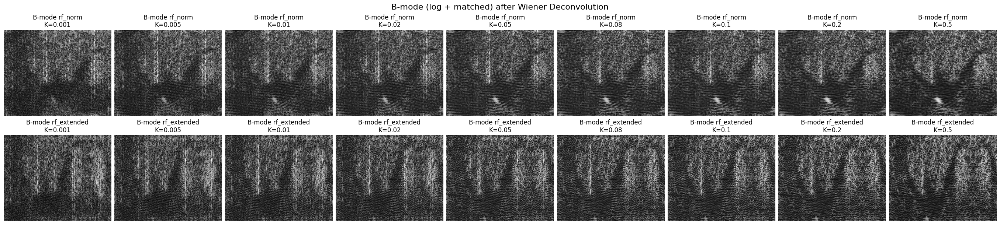

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --- Function to convert RF to B-mode with histogram matching ---
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --- Assuming you already loaded these ---
# rf_norm, rf_extended, psf_norm, bmode_vivo

K_values = [0.001, 0.005, 0.01, 0.02, 0.05, 0.08, 0.1, 0.2, 0.5]
fig, axes = plt.subplots(2, len(K_values), figsize=(3 * len(K_values), 6), constrained_layout=True)

for i, K in enumerate(K_values):
    # Deconvolution
    r_rest_norm = wiener_deconvolution(rf_norm, psf_norm, K=K)
    r_rest_ext  = wiener_deconvolution(rf_extended, psf_norm, K=K)

    # Convert to B-mode using histogram matching
    bmode_rest_norm = rf_to_matched_bmode(r_rest_norm, bmode_vivo)
    bmode_rest_ext  = rf_to_matched_bmode(r_rest_ext, bmode_vivo)

    # Plot B-mode for rf_norm
    axes[0, i].imshow(bmode_rest_norm, cmap='gray', aspect='auto')
    axes[0, i].set_title(f"B-mode rf_norm\nK={K}")
    axes[0, i].axis('off')

    # Plot B-mode for rf_extended
    axes[1, i].imshow(bmode_rest_ext, cmap='gray', aspect='auto')
    axes[1, i].set_title(f"B-mode rf_extended\nK={K}")
    axes[1, i].axis('off')

plt.suptitle("B-mode (log + matched) after Wiener Deconvolution", fontsize=16)
plt.show()


In [1]:
!python run_ddrm_vivo.py \
  --rf_mat     vivo/rf_extended.mat \
  --psf_mat    vivo/psf_norm.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --config     deblur_us.yml \
  --timesteps  200 \
  --eta        0.85 \
  --etaB       1.0 \
  --sigma_0    0.1 \
  --output_dir vivo/ddrm_output


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/scipy/io/matlab/_mio.py", line 39, in _open_file
    return open(file_like, mode), True
FileNotFoundError: [Errno 2] No such file or directory: 'vivo/rf_extended.mat'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/projects/minds/PDAS-M2-2025/MI

Restored RF shape: (256, 256)
Value range       : [0.42, 0.49]


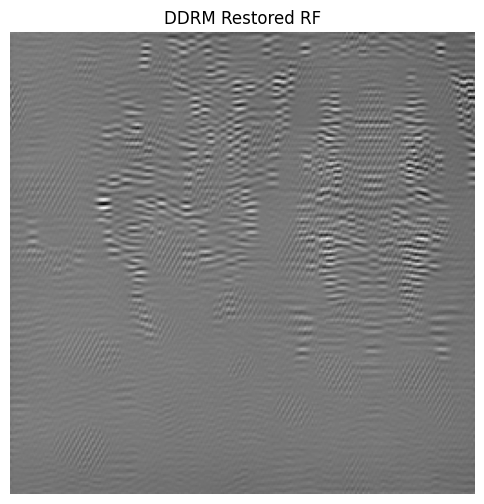

In [14]:
import scipy.io as sio
import matplotlib.pyplot as plt

# 1) Load the restored RF
mat = sio.loadmat('vivo/ddrm_output/restored_ddrm.mat')
rf_restored = mat['rf_restored']

# 2) Print its shape and value range
print(f"Restored RF shape: {rf_restored.shape}")
print(f"Value range       : [{rf_restored.min():.2f}, {rf_restored.max():.2f}]")

# 3) Display it in grayscale
plt.figure(figsize=(6,6))
plt.imshow(rf_restored, cmap='gray', aspect='auto')
plt.title('DDRM Restored RF')
plt.axis('off')
plt.show()


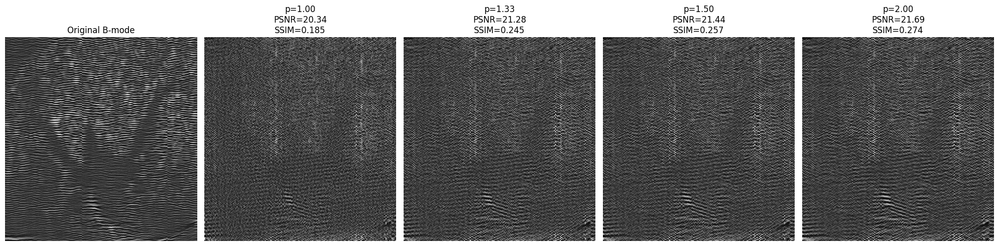

In [14]:
# === 1. Imports ===
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage.exposure import match_histograms

# === 2. Load RF and PSF from your data.mat ===
datapath = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(datapath)

rf = data["rf"].astype(np.float32)
bmode_ref = data["bmode"].astype(np.float32)
psf = data["PSF_estim"].astype(np.float32)
psf /= psf.sum()

# Normalize RF to [0, 1]
rf_norm = (rf - rf.min()) / (rf.max() - rf.min() + 1e-8)

# === 3. Zhao Lp-ADMM functions ===
def prox_lp(v, p, lam):
    eps = 1e-8
    return np.sign(v) * np.maximum(
        np.abs(v) - lam * p * np.abs(v + eps)**(p - 1),
        0
    )

def run_zhao_lp_admm_fixed(yinp, psf, p, lambd=0.02, rho=1.0, maxiter=200):
    psf = psf / psf.sum()
    FB, FBC = fft2(psf, s=yinp.shape), np.conj(fft2(psf, s=yinp.shape))
    x, u, d = yinp.copy(), yinp.copy(), np.zeros_like(yinp)
    denom = np.abs(FB)**2 + rho
    for _ in range(maxiter):
        vmd = u - d
        rhs = FBC * fft2(yinp) + rho * fft2(vmd)
        x   = np.real(ifft2(rhs / denom))
        u   = prox_lp(x + d, p, lam=lambd/rho)
        d  += x - u
    return np.clip(x, 0, 1)

# === 4. RF-to-B-mode conversion ===
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === 5. Sweep p values ===
p_values = [1.0, 4/3, 3/2, 2.0]
restorations = {}
metrics = {}
bmode_restorations = {}

for p in p_values:
    rec = run_zhao_lp_admm_fixed(rf_norm, psf, p=p)
    restorations[p] = rec
    metrics[p] = (
        peak_signal_noise_ratio(rf_norm, rec, data_range=1.0),
        structural_similarity(rf_norm, rec, data_range=1.0)
    )
    bmode_restorations[p] = rf_to_matched_bmode(rec, bmode_ref)

# === 6. Convert Original RF to B-mode ===
bmode_original = rf_to_matched_bmode(rf_norm, bmode_ref)

# === 7. Plot B-mode Results ===
ncols = 1 + len(p_values)
fig, axes = plt.subplots(1, ncols, figsize=(4 * ncols, 5))

axes[0].imshow(bmode_original, cmap="gray", aspect="auto")
axes[0].set_title("Original B-mode")
axes[0].axis("off")

for idx, p in enumerate(p_values, start=1):
    bmode = bmode_restorations[p]
    psnr, ssim = metrics[p]
    ax = axes[idx]
    ax.imshow(bmode, cmap="gray", aspect="auto")
    ax.set_title(f"p={p:.2f}\nPSNR={psnr:.2f}\nSSIM={ssim:.3f}")
    ax.axis("off")

plt.tight_layout()
plt.show()


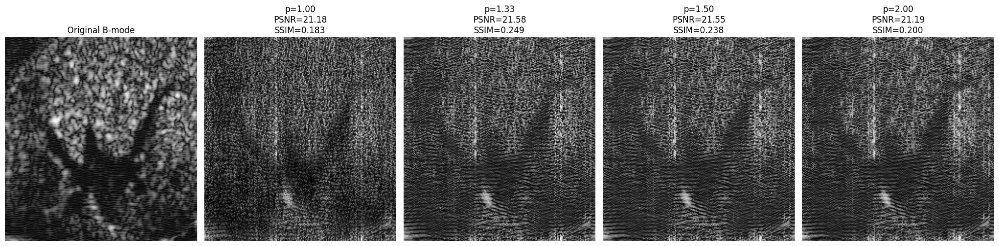

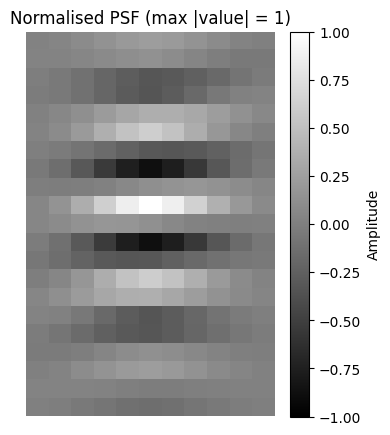

In [15]:
# === 1. Imports ===
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage.exposure import match_histograms

# === 2. Load and normalize RF and PSF ===
datapath = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(datapath)

rf = data["rf"].astype(np.float32)
bmode_ref = data["bmode"].astype(np.float32)
psf = data["PSF_estim"].astype(np.float32)

# Normalize RF to [-1, 1]
rf_min, rf_max = rf.min(), rf.max()
rf_norm = 2 * (rf - rf_min) / (rf_max - rf_min + 1e-8) - 1

# Normalize PSF to [-1, 1]
psf_abs_max = np.abs(psf).max()
psf_norm = psf / (psf_abs_max + 1e-8)

# === 3. Zhao Lp-ADMM functions ===
def prox_lp(v, p, lam):
    eps = 1e-8
    return np.sign(v) * np.maximum(
        np.abs(v) - lam * p * np.abs(v + eps)**(p - 1),
        0
    )

def run_zhao_lp_admm_fixed(yinp, psf, p, lambd=0.02, rho=1.0, maxiter=200):
    FB, FBC = fft2(psf, s=yinp.shape), np.conj(fft2(psf, s=yinp.shape))
    x, u, d = yinp.copy(), yinp.copy(), np.zeros_like(yinp)
    denom = np.abs(FB)**2 + rho
    for _ in range(maxiter):
        vmd = u - d
        rhs = FBC * fft2(yinp) + rho * fft2(vmd)
        x   = np.real(ifft2(rhs / denom))
        u   = prox_lp(x + d, p, lam=lambd/rho)
        d  += x - u
    return np.clip(x, -1, 1)

# === 4. RF-to-B-mode conversion ===
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === 5. Sweep p values ===
p_values = [1.0, 4/3, 3/2, 2.0]
restorations = {}
metrics = {}
bmode_restorations = {}

for p in p_values:
    rec = run_zhao_lp_admm_fixed(rf_norm, psf_norm, p=p)
    restorations[p] = rec
    metrics[p] = (
        peak_signal_noise_ratio(rf_norm, rec, data_range=2.0),
        structural_similarity(rf_norm, rec, data_range=2.0)
    )
    bmode_restorations[p] = rf_to_matched_bmode(rec, bmode_ref)

# === 6. Convert Original RF to B-mode ===
bmode_original = rf_to_matched_bmode(rf_norm, bmode_ref)

# === 7. Plot B-mode Results ===
ncols = 1 + len(p_values)
fig, axes = plt.subplots(1, ncols, figsize=(4 * ncols, 5))

axes[0].imshow(bmode_original, cmap="gray", aspect="auto")
axes[0].set_title("Original B-mode")
axes[0].axis("off")

for idx, p in enumerate(p_values, start=1):
    bmode = bmode_restorations[p]
    psnr, ssim = metrics[p]
    ax = axes[idx]
    ax.imshow(bmode, cmap="gray", aspect="auto")
    ax.set_title(f"p={p:.2f}\nPSNR={psnr:.2f}\nSSIM={ssim:.3f}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# === 8. Optional: Visualize Normalized PSF ===
plt.figure(figsize=(4, 5))
plt.imshow(psf_norm, cmap='gray', aspect='auto', vmin=-1, vmax=1)
plt.colorbar(label="Amplitude")
plt.title("Normalised PSF (max |value| = 1)")
plt.axis("off")
plt.show()


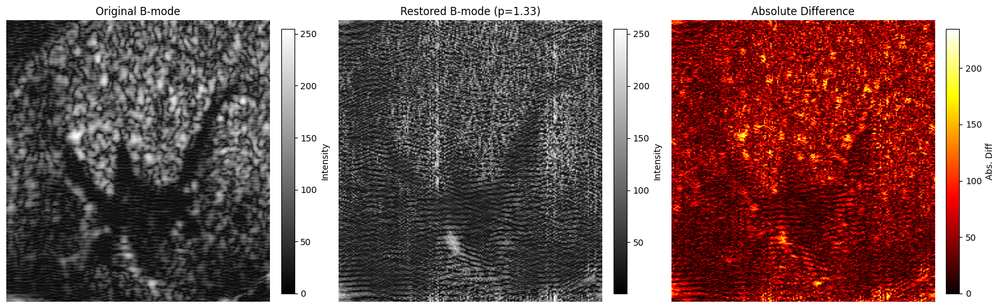

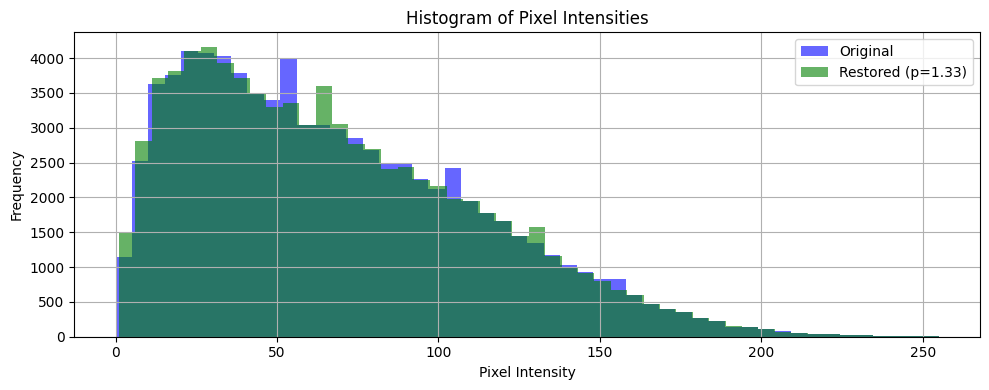

          Label  Min   Max      Mean       Std
       Original  0.0 255.0 67.937172 44.309471
Restored p=1.33  1.0 255.0 67.937958 44.308273

PSNR  (p=1.33): 13.02 dB
SSIM  (p=1.33): 0.0328


In [17]:
from skimage.metrics import peak_signal_noise_ratio as PSNR
from skimage.metrics import structural_similarity as SSIM

# --- 1. Get original and restored B-mode images ---
bmode_orig = bmode_original.astype(np.float32)
bmode_restored = bmode_restorations[4/3].astype(np.float32)  # p = 1.33
diff_map = np.abs(bmode_orig - bmode_restored)

# --- 2. Display images and difference with colorbars ---
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

im0 = axes[0].imshow(bmode_orig, cmap="gray", aspect="auto")
axes[0].set_title("Original B-mode")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label="Intensity")

im1 = axes[1].imshow(bmode_restored, cmap="gray", aspect="auto")
axes[1].set_title("Restored B-mode (p=1.33)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label="Intensity")

im2 = axes[2].imshow(diff_map, cmap="hot", aspect="auto")
axes[2].set_title("Absolute Difference")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label="Abs. Diff")

plt.tight_layout()
plt.show()

# --- 3. Histogram of pixel intensities ---
plt.figure(figsize=(10, 4))
plt.hist(bmode_orig.ravel(), bins=50, alpha=0.6, label="Original", color="blue")
plt.hist(bmode_restored.ravel(), bins=50, alpha=0.6, label="Restored (p=1.33)", color="green")
plt.title("Histogram of Pixel Intensities")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 4. Print stats and metrics ---
def describe(img, label):
    return {
        "Label": label,
        "Min": np.min(img),
        "Max": np.max(img),
        "Mean": np.mean(img),
        "Std": np.std(img)
    }

import pandas as pd
stats_orig = describe(bmode_orig, "Original")
stats_rest = describe(bmode_restored, "Restored p=1.33")
df = pd.DataFrame([stats_orig, stats_rest])

psnr = PSNR(bmode_orig, bmode_restored, data_range=255.0)
ssim = SSIM(bmode_orig, bmode_restored, data_range=255.0)

print(df.to_string(index=False))
print(f"\nPSNR  (p=1.33): {psnr:.2f} dB")
print(f"SSIM  (p=1.33): {ssim:.4f}")


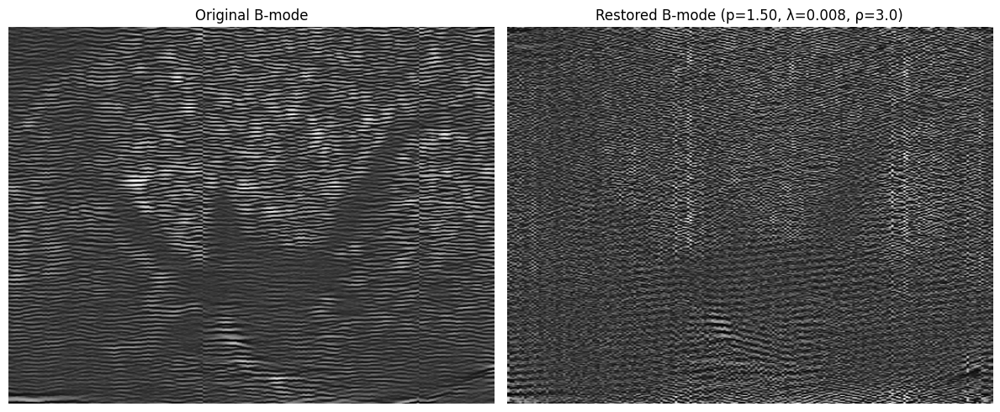

PSNR: 21.32 dB
SSIM: 0.2342


In [20]:
# === 1. Imports ===
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage.exposure import match_histograms

# === 2. Load RF and PSF from your data.mat ===
datapath = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(datapath)

rf = data["rf"].astype(np.float32)
bmode_ref = data["bmode"].astype(np.float32)
psf = data["PSF_estim"].astype(np.float32)
psf /= psf.sum()

# Normalize RF to [0, 1]
#rf_norm = (rf - rf.min()) / (rf.max() - rf.min() + 1e-8)

# === 3. Zhao Lp-ADMM functions ===
def prox_lp(v, p, lam):
    eps = 1e-8
    return np.sign(v) * np.maximum(
        np.abs(v) - lam * p * np.abs(v + eps)**(p - 1),
        0
    )

def run_zhao_lp_admm_fixed(yinp, psf, p, lambd=0.02, rho=1.0, maxiter=200):
    psf = psf / psf.sum()
    FB, FBC = fft2(psf, s=yinp.shape), np.conj(fft2(psf, s=yinp.shape))
    x, u, d = yinp.copy(), yinp.copy(), np.zeros_like(yinp)
    denom = np.abs(FB)**2 + rho
    for _ in range(maxiter):
        vmd = u - d
        rhs = FBC * fft2(yinp) + rho * fft2(vmd)
        x   = np.real(ifft2(rhs / denom))
        u   = prox_lp(x + d, p, lam=lambd/rho)
        d  += x - u
    return np.clip(x, 0, 1)

# === 4. RF-to-B-mode conversion ===
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === 5. Run only for p = 4/3 with smoother hyperparameters ===
p = 3/2
lambd = 0.008
rho = 3.0
maxiter = 400

restoration = run_zhao_lp_admm_fixed(rf_norm, psf, p=p, lambd=lambd, rho=rho, maxiter=maxiter)
bmode_restored = rf_to_matched_bmode(restoration, bmode_ref)

# === 6. Convert Original RF to B-mode ===
bmode_original = rf_to_matched_bmode(rf_norm, bmode_ref)

# === 7. Display Comparison ===
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(bmode_original, cmap="gray", aspect="auto")
axes[0].set_title("Original B-mode")
axes[0].axis("off")

axes[1].imshow(bmode_restored, cmap="gray", aspect="auto")
axes[1].set_title(f"Restored B-mode (p={p:.2f}, λ={lambd}, ρ={rho})")
axes[1].axis("off")

plt.tight_layout()
plt.show()

# === 8. Optional: Metrics ===
psnr = peak_signal_noise_ratio(rf_norm, restoration, data_range=1.0)
ssim = structural_similarity(rf_norm, restoration, data_range=1.0)
print(f"PSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}")
